## <center>Amazon fine food review - Sentiment analysis</center>

This code along is to study Amazon food review from customers, and try to predict whether a review is positive or negative. The dataset contains more than 500K reviews with number of upvotes & total votes to those comments.

## Understanding the data
Our main objective is to predict whether a review is Positive or Negative based on the Text.

If we see the Score column, it has values 1,2,3,4,5 . Considering 1, 2 as Negative reviews and 4, 5 as Positive reviews. For Score = 3 we will consider it as Neutral review and lets delete the rows that are neutral, so that we can predict either Positive or Negative

HelfulnessNumerator says about number of people found that review usefull and HelpfulnessDenominator is about usefull review count + not so usefull count. So, from this we can see that HelfulnessNumerator is always less than or equal to HelpfulnesDenominator.


### About the Dataset:

Dataset Summary:
- Number of reviews: 568,454
- Number of users: 256,059
- Number of products: 74,258
- Timespan: Oct 1999 - Oct 2012
- Number of Attributes/Columns in data: 10

Following is the attributes information:

|Feature|Description|
|-----|-----|
|Id| index of the dataset|
|ProductId| unique identifier for the product|
|UserId| unqiue identifier for the user|
|ProfileName| name of the user| 
|HelpfulnessNumerator| number of users who found the review helpful|
|HelpfulnessDenominator| number of users who indicated whether they found the review helpful or not|
|Score| rating between 1 and 5|
|Time| timestamp for the review|
|Summary| brief summary of the review|
|Text| text of the review|


Objective:
Given a review, determine whether the review is positive (Rating of 4 or 5) or negative (rating of 1 or 2).

In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

## Loading the Libraries

In [2]:
import pandas as pd
import numpy as np
import re
from nltk.stem.porter import PorterStemmer
from nltk.stem import SnowballStemmer
from nltk.corpus import stopwords
from string import punctuation
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import nltk
import warnings
warnings.filterwarnings("ignore")

In [3]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/raisaurabh04/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

## Loading the data

In [4]:
df = pd.read_csv("../data/Reviews.csv")
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [5]:
# Shape of our data
df.columns

Index(['Id', 'ProductId', 'UserId', 'ProfileName', 'HelpfulnessNumerator',
       'HelpfulnessDenominator', 'Score', 'Time', 'Summary', 'Text'],
      dtype='object')

### Task 1:  Remove Neutral reviews then convert `score` <=3 as `0` and >=3 as `1`. Drop the duplicates from the dataframe. Store only those reviews which the number of people found useful. Sort values based on time and take a subset of `100000` rows.

In [6]:
data = df[df['Score'] != 3]
data.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [7]:
data['Score'] = data['Score'].apply(lambda x : 0 if x <= 3 else 1)

In [8]:
data.shape

(525814, 10)

In [9]:
data.drop_duplicates(subset=('UserId', 'ProfileName', 'Time', 'Text'), keep='first', inplace=True)
data.shape

(364173, 10)

In [10]:
data = data[data['HelpfulnessNumerator'] <= data['HelpfulnessDenominator']]
data.shape

(364171, 10)

In [11]:
data.sort_values(by='Time', inplace=True)

In [12]:
final = data.iloc[ : 100000, : ]

### Task 2: Remove stopwords/punctuation and tokenize reviews(`final['Text']`). Then apply stemming on review text. 

In [13]:
%%time
final['Text'] = final['Text'].apply(lambda x : re.sub('[^a-zA-Z]',' ', x))

final['Text'] = final['Text'].apply(lambda x : x.lower())

final['Text'] = [nltk.word_tokenize(x) for x in final['Text']]

stopwords = set(stopwords.words('english'))

final['Text'] = final['Text'].apply(lambda row : [word for word in row if word not in stopwords])

stemmer = PorterStemmer()
snow_stemmer = SnowballStemmer('english')
final['Text'] = final['Text'].apply(lambda x : [snow_stemmer.stem(i) for i in x])

final['Text'] = final['Text'].apply(lambda x : ' '.join(x))

final.head()

CPU times: user 1min 46s, sys: 515 ms, total: 1min 46s
Wall time: 1min 46s


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
150523,150524,0006641040,ACITT7DI6IDDL,shari zychinski,0,0,1,939340800,EVERY book is educational,witti littl book make son laugh loud recit car...
150500,150501,0006641040,AJ46FKXOVC7NR,Nicholas A Mesiano,2,2,1,940809600,This whole series is great way to spend time w...,rememb see show air televis year ago child sis...
451855,451856,B00004CXX9,AIUWLEQ1ADEG5,Elizabeth Medina,0,0,1,944092800,Entertainingl Funny!,beetlejuic well written movi everyth excel act...
230284,230285,B00004RYGX,A344SMIA5JECGM,Vincent P. Ross,1,2,1,944438400,A modern day fairy tale,twist rumplestiskin captur film star michael k...
451854,451855,B00004CXX9,AJH6LUC1UT1ON,The Phantom of the Opera,0,0,1,946857600,FANTASTIC!,beetlejuic excel funni movi keaton hilari wack...


### Task 3: Plot the WordCloud for Frequent words in Positive Sentiments 

In [14]:
pos_words = ' '.join([text for text in final['Text'][final['Score'] == 1]])

In [15]:
pos_words

'witti littl book make son laugh loud recit car drive along alway sing refrain learn whale india droop rose love new word book introduc silli classic book will bet son still abl recit memori colleg rememb see show air televis year ago child sister later bought lp day thirti someth use seri book amp song student teach preschool amp turn whole school purchas cd along book children amp tradit live beetlejuic well written movi everyth excel act special effect delight chose view movi twist rumplestiskin captur film star michael keaton geena davi prime tim burton masterpiec rumbl absurd wonder pace point dull moment beetlejuic excel funni movi keaton hilari wacki beetlejuic great special effect help film think one best movi ever made sure agre good time watch beetlejuic one movi movi collect fill comedi action whatev els want call bought apart infest fruit fli hour trap quot attract quot mani fli within day practic gone may long term solut fli drive crazi consid buy one caution surfac sticki

<Figure size 1080x504 with 0 Axes>

(-0.5, 799.5, 499.5, -0.5)

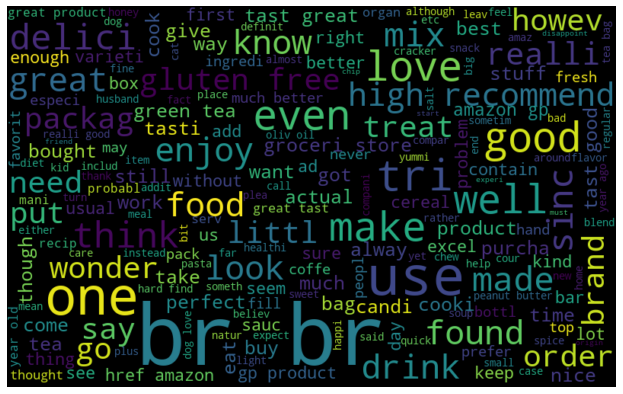

In [16]:
pos_wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(pos_words)
plt.figure(figsize=(15, 7))
plt.imshow(pos_wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

<Figure size 1080x504 with 0 Axes>

(-0.5, 799.5, 499.5, -0.5)

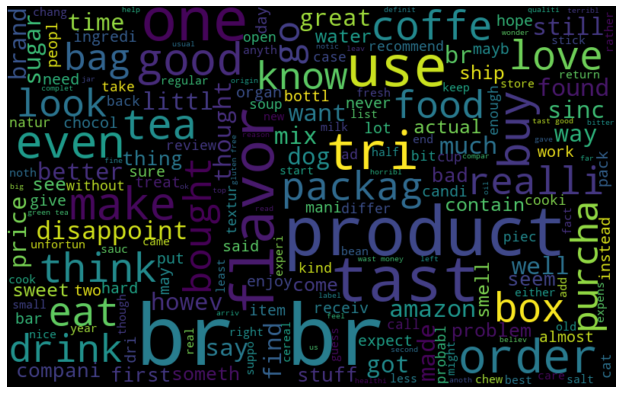

In [17]:
neg_words = ' '.join([text for text in final['Text'][final['Score'] == 0]])

neg_wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(neg_words)
plt.figure(figsize=(15, 7))
plt.imshow(neg_wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

### Task 4: Store `final['Text']` in X and `final['Score']` in y. Implement the count vectorisation on all rows and implement a logistic regression model on vectorised dataframe. Predict the accuracy on test data.

In [18]:
%%time
X = final['Text']
y = final['Score']

count_vec = CountVectorizer(stop_words='english')
X_c = count_vec.fit_transform(X)
print('No of features: {}'.format(X_c.shape[1]))

X_train, X_test, y_train, y_test = train_test_split(X_c, y, test_size=0.3, random_state=0)
print('No of train records: {}'.format(X_train.shape[0]))
print('No of test records: {}'.format(X_test.shape[0]))

clf_model = LogisticRegression()
clf = clf_model.fit(X_train, y_train)
acc = clf.score(X_test, y_test)
print('Accuracy of Model: {}'.format(acc))

No of features: 39020
No of train records: 70000
No of test records: 30000
Accuracy of Model: 0.9246666666666666
CPU times: user 19.7 s, sys: 287 ms, total: 19.9 s
Wall time: 12.3 s


### Task 5: Calculate Top 20 positive and Negative words based on coefficients for count vectorisation.

In [19]:
v = count_vec.get_feature_names()

coef = clf.coef_.tolist()[0]

coef_df = pd.DataFrame({'Word' : v, 'Coefficient' : coef})

coef_df.head()

coef_df.sort_values(by=['Coefficient', 'Word'], ascending=[0, 1], inplace=True)

print('--- Top 20 positive ---')
print(coef_df.head(20).to_string(index=False))

print('--- Top 20 negative ---')
print(coef_df.tail(20).to_string(index=False))

,Word,Coefficient
0,aa,0.172184
1,aaa,0.164863
2,aaaa,0.037644
3,aaaaa,-0.923813
4,aaaaaa,0.000101


--- Top 20 positive ---
          Word  Coefficient
       skeptic     2.669601
        awesom     2.099173
          hook     1.973727
         uniqu     1.920835
          solv     1.918582
 emeraldforest     1.916418
        addict     1.871843
       perfect     1.828618
        delici     1.803816
         excel     1.748761
          amaz     1.741100
           dum     1.647215
         sport     1.646910
           ctc     1.594480
         ramun     1.587479
       mercuri     1.565454
     smoothest     1.555593
          best     1.546400
           sue     1.509099
           dew     1.504829
--- Top 20 negative ---
       Word  Coefficient
       yuck    -1.751722
     defeat    -1.755932
      broke    -1.757672
     emptor    -1.759837
    africaf    -1.767177
     cancel    -1.790081
     return    -1.845876
   unaccept    -1.852032
    frichik    -1.864637
   powergel    -1.914294
    horribl    -1.924406
 disappoint    -1.928405
     garbag    -1.950946
    terribl   

### Task 6: As we see in above task that some of those significant coefficients are not meaningful. Try to implement the other vectorisation(i.e. TfidfVectorizer) on all rows and implement a logistic regression model on the vectorised dataframe.

In [20]:
tf_idf = TfidfVectorizer(stop_words='english')

In [21]:
X_tf_idf = tf_idf.fit_transform(X)

In [22]:
print('No of features: {}'.format(X_tf_idf.shape[1]))

X_train, X_test, y_train, y_test = train_test_split(X_tf_idf, y, test_size=0.3, random_state=0)
print('No of train records: {}'.format(X_train.shape[0]))
print('No of test records: {}'.format(X_test.shape[0]))

clf_model_tf_idf = LogisticRegression()
clf_tf_idf = clf_model_tf_idf.fit(X_train, y_train)
acc = clf_tf_idf.score(X_test, y_test)
print('Accuracy of Model: {}'.format(acc))

No of features: 39020
No of train records: 70000
No of test records: 30000
Accuracy of Model: 0.9244666666666667


### Task 7: Calculate Top 20 positive and Negative words based on coefficients for Tfidf vectorisation.

In [23]:
v = tf_idf.get_feature_names()

coef = clf_tf_idf.coef_.tolist()[0]

coef_df = pd.DataFrame({'Word' : v, 'Coefficient' : coef})

coef_df.head()

coef_df.sort_values(by=['Coefficient', 'Word'], ascending=[0, 1], inplace=True)

print('--- Top 20 positive ---')
print(coef_df.head(20).to_string(index=False))

print('--- Top 20 negative ---')
print(coef_df.tail(20).to_string(index=False))

,Word,Coefficient
0,aa,0.111432
1,aaa,0.141197
2,aaaa,0.028958
3,aaaaa,-0.375576
4,aaaaaa,0.003020


--- Top 20 positive ---
    Word  Coefficient
   great    10.996133
    best     9.114289
  delici     7.823858
    love     7.775841
 perfect     7.068830
   excel     6.614090
 favorit     5.712379
    good     5.409396
    nice     5.154446
    amaz     4.969164
  wonder     4.937926
  awesom     4.549184
  addict     4.373474
   yummi     4.028005
  smooth     3.970473
   tasti     3.966834
   alway     3.931192
   happi     3.800227
   thank     3.784730
    easi     3.782349
--- Top 20 negative ---
       Word  Coefficient
       lack    -3.849260
        bad    -3.961095
         ok    -4.066465
       wast    -4.137430
    thought    -4.156975
       mayb    -4.175512
       weak    -4.182094
  tasteless    -4.211815
       wors    -4.227410
      money    -4.340481
      stale    -4.702292
      bland    -4.852065
   unfortun    -4.913533
      threw    -5.096945
         aw    -5.193172
    horribl    -5.527687
    terribl    -5.776243
     return    -5.781804
      worst    

In [24]:
import gensim